In [ ]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import SubsetRandomSampler
from skimage.color import lab2rgb, rgb2lab, rgb2gray
from datetime import datetime
from torch.autograd import Variable
import matplotlib
import matplotlib.pyplot as plt
from torchsummary import summary as summary_
from tqdm import tqdm
import re

In [ ]:
from google.colab import drive
\
# Accessing My Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install kaggle  
from google.colab import files  
files.upload() 

In [ ]:
!mkdir -p ~/.kaggle  
!cp kaggle.json ~/.kaggle/    
!chmod 600 ~/.kaggle/kaggle.json 

In [ ]:
!kaggle datasets download -d aayush9753/image-colorization-dataset

100% 472M/473M [00:03<00:00, 109MB/s]
100% 473M/473M [00:03<00:00, 130MB/s]


In [ ]:
!unzip image-colorization-dataset.zip  

###Custom Dataset

In [ ]:
class ColorDataSet(Dataset):
    def __init__(self, idx_set):
        self.gray_path = '/content/data/train_black'
        self.color_path = '/content/data/train_color'
        self.gray_files = os.listdir(self.gray_path)
        self.color_files = os.listdir(self.color_path)
    def __len__(self):
        return len(self.gray_files)
    
    def __getitem__(self, idx):        
        img_gray, img_color = self.load_img(idx)
                
        return img_gray, img_color
    
    def load_img(self, idx):
        img_color = cv2.imread(self.color_path+'/'+ self.color_files[idx])
        img_color = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)
        img_color = cv2.resize(img_color, (256, 256))
        img_color = np.transpose(img_color, (2, 0, 1))
        
        img_gray = cv2.imread(self.gray_path+'/'+ self.gray_files[idx])
        img_gray = cv2.cvtColor(img_gray, cv2.COLOR_BGR2RGB)
        img_gray = cv2.resize(img_gray, (256, 256))
        img_gray = np.transpose(img_gray, (2, 0, 1))

        img_gray = img_gray.astype('float32') 
        img_color = img_color.astype('float32') 
        img_gray = (img_gray/127.5) - 1.
        img_color = (img_color/127.5) - 1.
        
        return img_gray, img_color

In [ ]:
idx_list = list(np.arange(1000))
train_val_split = 0.2
np.random.seed(0)
idx_split = int(train_val_split*1000)
np.random.shuffle(idx_list)
train_idx = idx_list[idx_split:1000]
val_idx = idx_list[:idx_split]

train_set = ColorDataSet(idx_set=train_idx)
valid_set = ColorDataSet(idx_set=val_idx)

train_loader = DataLoader(train_set , batch_size=32 , shuffle=False )
valid_loader = DataLoader(valid_set , batch_size=32 , shuffle=False)

In [ ]:
train_data = next(iter(train_loader))
test_data = next(iter(valid_loader))

In [ ]:
print(torch.max(train_data[0]))
print(torch.min(train_data[0]))
print(torch.max(train_data[1]))
print(torch.min(train_data[1]))

tensor(1.)
tensor(-1.)
tensor(1.)
tensor(-1.)


##1번 Generator & Discriminator

In [ ]:
class UNetDown(nn.Module):
    def __init__(self, in_size, out_size, normalize=True, dropout=0.0):
        super(UNetDown, self).__init__()
        layers = [nn.Conv2d(in_size, out_size, 4, 2, 1, bias=False)]
        if normalize:
            layers.append(nn.BatchNorm2d(out_size))
        layers.append(nn.LeakyReLU(0.2))
        if dropout:
            layers.append(nn.Dropout(dropout))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UNetUp(nn.Module):
    def __init__(self, in_size, out_size, dropout=0.0):
        super(UNetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_size, out_size, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_size),
            nn.ReLU(inplace=True),
        ]
        if dropout:
            layers.append(nn.Dropout(dropout))

        self.model = nn.Sequential(*layers)

    def forward(self, x, skip_input):
        x = self.model(x)
        x = torch.cat((x, skip_input), 1)

        return x


class GeneratorUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=3):
        super(GeneratorUNet, self).__init__()

        self.down1 = UNetDown(in_channels, 64, normalize=False)
        self.down2 = UNetDown(64, 128)
        self.down3 = UNetDown(128, 256)
        self.down4 = UNetDown(256, 512, dropout=0.5)
        self.down5 = UNetDown(512, 512, dropout=0.5)
        self.down6 = UNetDown(512, 512, dropout=0.5)
        self.down7 = UNetDown(512, 512, dropout=0.5)
        self.down8 = UNetDown(512, 512, normalize=False, dropout=0.5)

        self.up1 = UNetUp(512, 512, dropout=0.5)
        self.up2 = UNetUp(1024, 512, dropout=0.5)
        self.up3 = UNetUp(1024, 512, dropout=0.5)
        self.up4 = UNetUp(1024, 512, dropout=0.5)
        self.up5 = UNetUp(1024, 256)
        self.up6 = UNetUp(512, 128)
        self.up7 = UNetUp(256, 64)

        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(128, out_channels, 4, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        d8 = self.down8(d7)
        u1 = self.up1(d8, d7)
        u2 = self.up2(u1, d6)
        u3 = self.up3(u2, d5)
        u4 = self.up4(u3, d4)
        u5 = self.up5(u4, d3)
        u6 = self.up6(u5, d2)
        u7 = self.up7(u6, d1)

        return self.final(u7)

In [ ]:
class discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.BatchNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels * 2, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1, bias=False)
        )

    def forward(self, img_A, img_B):
        img_input = torch.cat((img_A, img_B), 1)
        return self.model(img_input)

##2번 Generator & Discriminator

In [ ]:
class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()

        # --------- Encoder ---------
        self.encod1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=64, kernel_size=4, padding=1, stride=2),
        )
        self.encod2 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope=0.2)
        )
        self.encod3 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(negative_slope=0.2)
        )
        self.encod4 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(negative_slope=0.2)
        )
        self.encod5 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(negative_slope=0.2)
        )
        self.encod6 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2),
            nn.BatchNorm2d(512),
        )
        self.encod7 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(negative_slope=0.2)
        )
        self.encod8 = nn.Sequential(
            nn.Conv2d(in_channels=512, out_channels=512, kernel_size=4, padding=1, stride=2),
        )

        # --------- Decoder ---------
        self.decod8 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.Dropout2d(0.5),
            nn.ReLU()
        )
        self.decod7 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.Dropout2d(0.5),
            nn.ReLU()
        )
        self.decod6 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.Dropout2d(0.5),
            nn.ReLU()
        )
        self.decod5 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 512, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.decod4 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 512, out_channels=256, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.decod3 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 256, out_channels=128, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.decod2 = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 128, out_channels=64, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.decodout = nn.Sequential(
            nn.ConvTranspose2d(in_channels=2 * 64, out_channels=3, kernel_size=4, padding=1, stride=2),
            nn.Tanh())

    def forward(self, x: torch.Tensor):
        # --------- Encoder ---------
        e1 = self.encod1(x)
        e2 = self.encod2(e1)
        e3 = self.encod3(e2)
        e4 = self.encod4(e3)
        e5 = self.encod5(e4)
        e6 = self.encod6(e5)
        e7 = self.encod7(e6)
        e8 = self.encod8(e7)

        # --------- Decoder ---------
        d8 = self.decod8(e8)
        d7 = self.decod7(torch.cat([d8, e7], 1))  
        d6 = self.decod6(torch.cat([d7, e6], 1))  
        d5 = self.decod5(torch.cat([d6, e5], 1))  
        d4 = self.decod4(torch.cat([d5, e4], 1))  
        d3 = self.decod3(torch.cat([d4, e3], 1))  
        d2 = self.decod2(torch.cat([d3, e2], 1))  

        out = self.decodout(torch.cat([d2, e1], 1))

        return out

In [ ]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        self.image_size = 256

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels=6, out_channels=64, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2),

            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope=0.2),
            
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(negative_slope=0.2),
 
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(negative_slope=0.2),
            
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2),
        )

        self.fc = nn.Sequential(
            nn.Linear(in_features=int(self.image_size / (2 ** 5)) * int((self.image_size / (2 ** 5))) * 1,
                      out_features=16),
            nn.LeakyReLU(),
            nn.Linear(in_features=16, out_features=1),
        )

    def forward(self, clr: torch.Tensor, bw: torch.Tensor):

        cat_clr_bw = torch.cat((clr, bw), 1)
        features = self.conv(cat_clr_bw)
        flatten = features.view(-1, int(self.image_size / (2 ** 5)) * int(self.image_size / (2 ** 5) * 1))
        result = self.fc(flatten)
        output = torch.sigmoid(result)

        return output

##3번 Discriminator

In [ ]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        self.image_size = 256

        self.conv = nn.Sequential(
            # input = bs x 256 x 256 x 6 / output = bs x 128 x 128 x 64
            nn.Conv2d(in_channels=6, out_channels=64, kernel_size=3, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2),

            # input = bs x 128 x 128 x 64 / output = bs x 64 x 64 x 128
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, stride=2),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope=0.2),
            
            # input = bs x 64 x 64 x 128 / output = bs x 32 x 32 x 256
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, stride=2),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(negative_slope=0.2),

            # input = bs x 32 x 32 x 256 / output = bs x 16 x 16 x 512
            nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1, stride=2),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(negative_slope=0.2),
            
            # input = bs x 16 x 16 x 512 / output = bs x 8 x 8 x 1
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=3, padding=1, stride=1)
        )

    def forward(self, clr: torch.Tensor, bw: torch.Tensor):

        cat_clr_bw = torch.cat((clr, bw), 1)
        features = self.conv(cat_clr_bw)
        output = torch.sigmoid(features)

        return output

###모델

In [ ]:
model = Generator().to(device)
summary_(model,[(3,256,256),(3,256,256)],batch_size=1)

In [ ]:
model = Discriminator().to(device)
summary_(model,[(3,256,256),(3,256,256)],batch_size=1)

In [ ]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

In [ ]:
G=Generator().to(device)
D=Discriminator().to(device)

###시각화 

<Figure size 1080x1080 with 0 Axes>

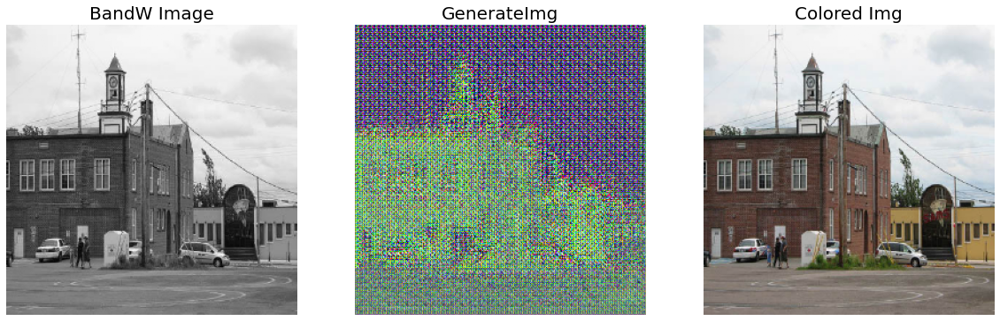

In [ ]:
def fig (b_w_image, gen_image, tar_image) :
    b_w_image = b_w_image.permute(0, 2, 3, 1).detach().cpu()
    gen_image = gen_image.permute(0, 2, 3, 1).detach().cpu()
    tar_image = tar_image.permute(0, 2, 3, 1).detach().cpu()
    plt.figure(figsize = (20, 20))
    
    plt.subplot(1,3,1)
    plt.imshow((b_w_image[0] + 1.0) / 2.0)
    plt.title('BandW Image',fontsize = 20)
    plt.axis('off')
    
    plt.subplot(1,3,2)
    plt.imshow((gen_image[0] + 1.0) / 2.0)
    plt.title('GenerateImg',fontsize = 20)
    plt.axis('off')
    
    plt.subplot(1,3,3)
    plt.imshow((tar_image[0] + 1.0) / 2.0)
    plt.title('Colored Img',fontsize = 20)
    plt.axis('off')
    
    plt.show()

def generate_images(model, test_input, tar):
  prediction = model(test_input)
  plt.figure(figsize=(15,15))

  fig(test_input,prediction,tar)


gray_img = test_data[0]
rgb_img = test_data[1]
generate_images(G,gray_img.to(device),rgb_img.to(device))

###Training 

In [ ]:
import torch,gc
gc.collect()
torch.cuda.empty_cache()

lr=2e-4
betas=(0.5,0.999)
g_loss=[]   # storing Generator loss
d_loss=[]   # storing Discriminator loss
g_epoch_loss=[]
d_epoch_loss=[]
Epochs = 150

SAVEPATH = '/content/drive/MyDrive/Colab Notebooks/pix2pix/'
print(os.path.isfile(SAVEPATH + 'model.pth'))

True


In [ ]:
g_optimizer=optim.Adam(G.parameters(),lr=lr,betas=betas)
d_optimizer=optim.Adam(D.parameters(),lr=lr,betas=betas)

checkpoint = torch.load(SAVEPATH + 'pix2pix.pth')
G.load_state_dict(checkpoint['G_state_dict'])
D.load_state_dict(checkpoint['D_state_dict'])
g_optimizer.load_state_dict(checkpoint['g_optimizer_state_dict'])
d_optimizer.load_state_dict(checkpoint['d_optimizer_state_dict'])

#criteria=nn.BCELoss(size_average=False) #loss function BCEwithLogits
criteria = nn.BCEWithLogitsLoss()
criteriaL1 = torch.nn.L1Loss()
lambda_L1 = 100.0

model.train()

for i in range(Epochs):
    t1=datetime.now()
    discriminator_running_loss = 0.0
    generator_running_loss = 0.0
    size = 0

    for ix, data in enumerate(train_loader):
        gray_img = data[0].to(device)
        rgb_img = data[1].to(device)

        batch_size = rgb_img.size(0)
        size += batch_size

        ## Discriminator train 
        D.zero_grad()
        #real_loss
        out=D(rgb_img,gray_img)
        real_loss=criteria(out,Variable(torch.ones_like(out)))
        #fake_loss
        fake_images=G(gray_img).detach()
        fake_out=D(fake_images,gray_img)
        fake_loss=criteria(fake_out,Variable(torch.zeros_like(fake_out)))

        loss_D = (real_loss + fake_loss) * 0.5

        discriminator_running_loss += loss_D.item()#.cpu().detach().numpy()

        loss_D.backward()
        d_optimizer.step()

        G.zero_grad()
        result=D(G(gray_img),gray_img)
        GAN_loss=criteria(result,Variable(torch.ones_like(result)))
        L1_loss = criteriaL1(G(gray_img),rgb_img) * lambda_L1

        loss_G = GAN_loss + L1_loss

        generator_running_loss += loss_G.cpu().detach().numpy()
        loss_G.backward()
        g_optimizer.step()
    epoch_dis_loss = discriminator_running_loss / size
    epoch_gen_loss = generator_running_loss / size

    d_loss.append(epoch_dis_loss)
    g_loss.append(epoch_gen_loss)
    print("===> Epoch[{}]({}/{}): Loss_D: {:.4f} Loss_G: {:.4f}".format(
            i, ix, len(train_loader), d_loss[i], g_loss[i]))
    generate_images(G,test_data[0].to(device),test_data[1].to(device))
    if(i+1) % 10 == 0:
      torch.save({'epoch':i,
                  'G_state_dict': G.state_dict(),
                  'D_state_dict': D.state_dict(),
                  'g_optimizer_state_dict':g_optimizer.state_dict(),
                  'd_optimizer_state_dict':d_optimizer.state_dict()},SAVEPATH + 'pix2pix.pth')
    gc.collect()
    torch.cuda.empty_cache()
plt.plot(g_loss)
plt.plot(d_loss)
plt.legend(["Generator","Discriminator"])


###Test 시각화

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<Figure size 1080x1080 with 0 Axes>

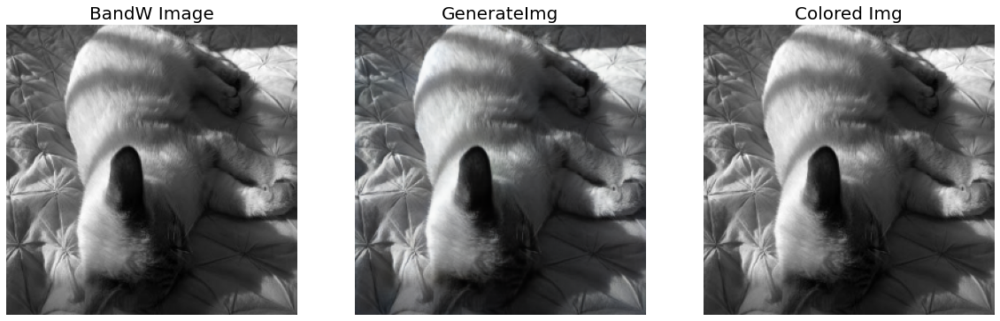

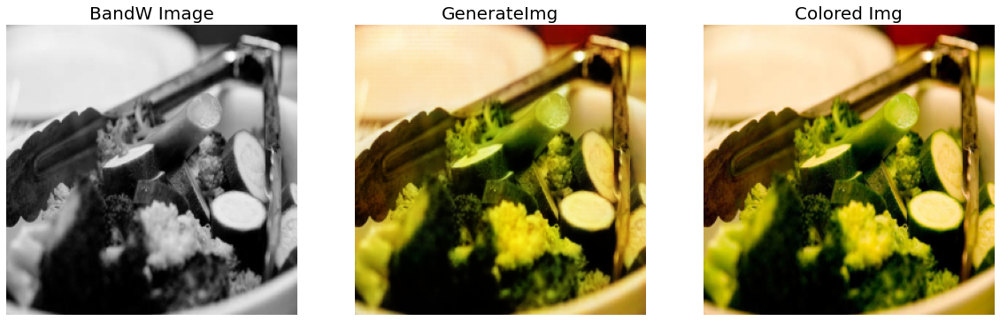

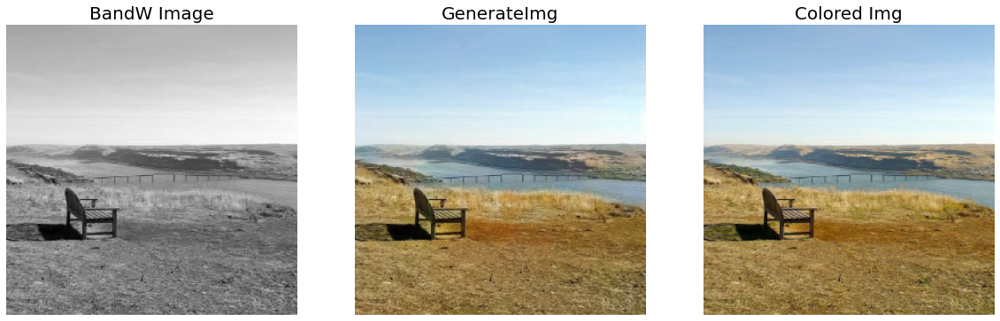

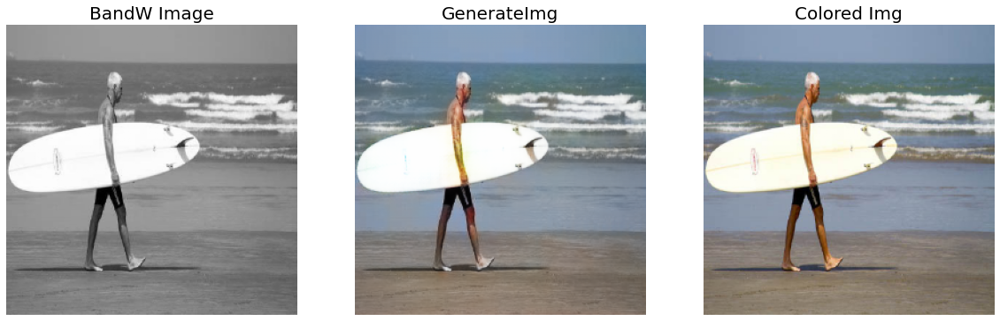

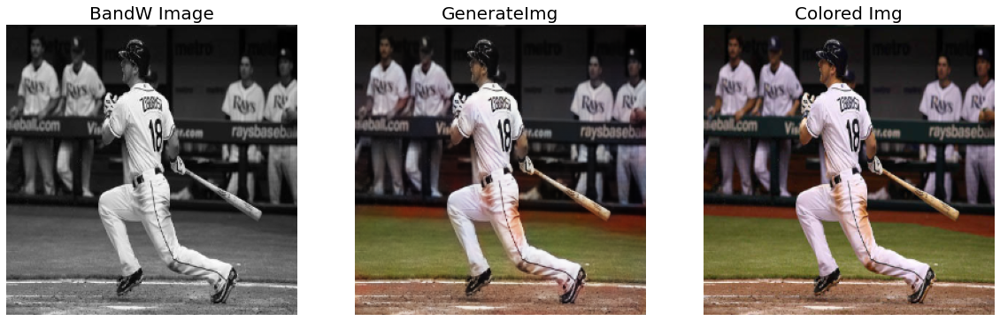

...

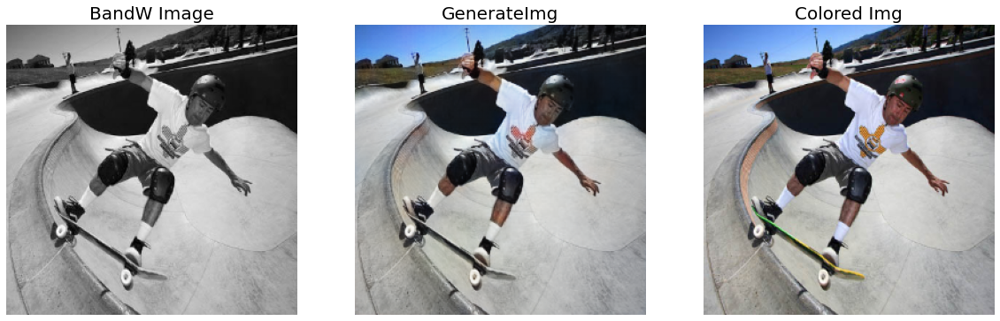

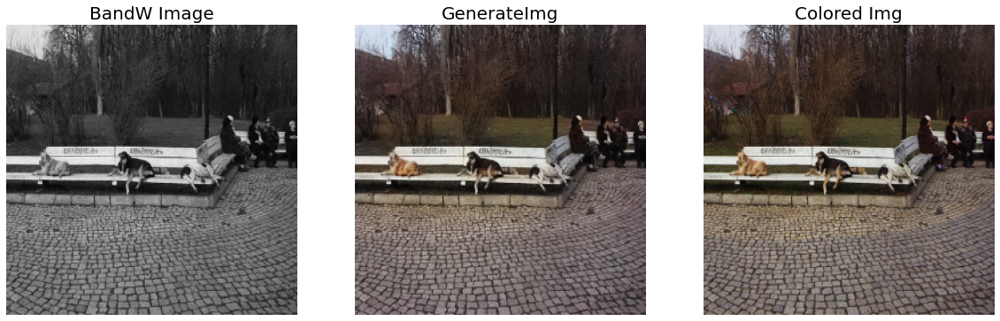

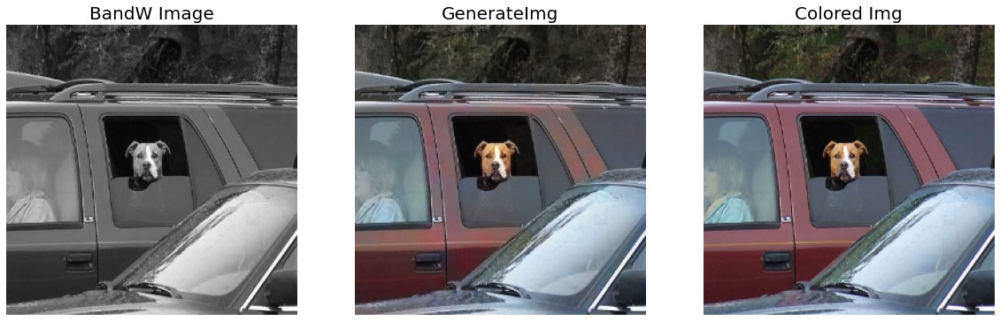

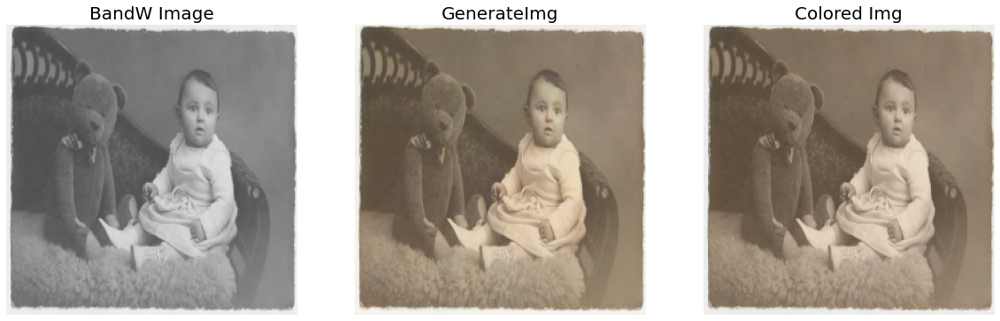

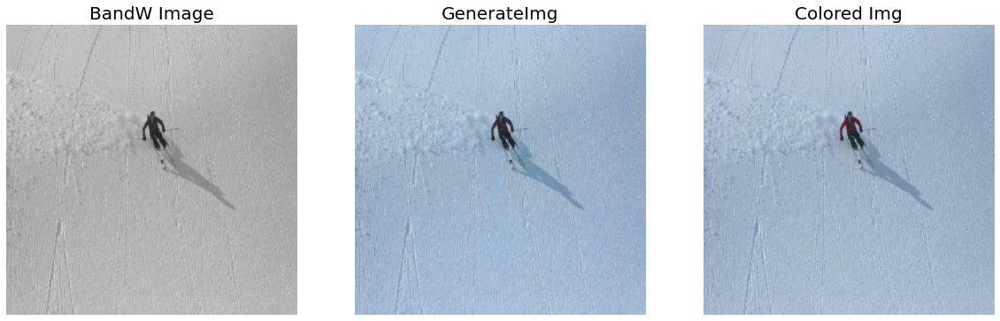

In [ ]:
def test (b_w_image, gen_image, tar_image) :
    b_w_image = b_w_image.permute(0, 2, 3, 1).detach().cpu()
    gen_image = gen_image.permute(0, 2, 3, 1).detach().cpu()
    tar_image = tar_image.permute(0, 2, 3, 1).detach().cpu()

    for i in range(len(b_w_image)):
      plt.figure(figsize = (20, 20))
      
      plt.subplot(1,3,1)
      plt.imshow((b_w_image[i] + 1.0) / 2.0)
      plt.title('BandW Image',fontsize = 20)
      plt.axis('off')
      
      plt.subplot(1,3,2)
      plt.imshow((gen_image[i] + 1.0) / 2.0)
      plt.title('GenerateImg',fontsize = 20)
      plt.axis('off')
      
      plt.subplot(1,3,3)
      plt.imshow((tar_image[i] + 1.0) / 2.0)
      plt.title('Colored Img',fontsize = 20)
      plt.axis('off')
      
    plt.show()

def generate_test_images(model, test_input, tar):
  prediction = model(test_input)
  plt.figure(figsize=(15,15))

  test(test_input,prediction,tar)


checkpoint = torch.load(SAVEPATH + 'pix2pix.pth')
G.load_state_dict(checkpoint['G_state_dict'])

gray_img = test_data[0]
rgb_img = test_data[1]
generate_test_images(G,gray_img.to(device),rgb_img.to(device))

###영상품질 평가 지표

In [ ]:
def PSNR(gray,color):
  gray = torch.Tensor(gray)
  color = torch.Tensor(color)
  mse = torch.mean((gray-color)**2)
  return 20 * torch.log10(255.0 / torch.sqrt(mse))

def SSIM(y_true , y_pred):
    u_true = np.mean(y_true)
    u_pred = np.mean(y_pred)
    var_true = np.var(y_true)
    var_pred = np.var(y_pred)
    std_true = np.sqrt(var_true)
    std_pred = np.sqrt(var_pred)
    c1 = np.square(0.01*7)
    c2 = np.square(0.03*7)
    ssim = (2 * u_true * u_pred + c1) * (2 * std_pred * std_true + c2)
    denom = (u_true ** 2 + u_pred ** 2 + c1) * (var_pred + var_true + c2)
    return ssim / denom

###Test 

In [ ]:
checkpoint = torch.load(SAVEPATH + 'pix2pix(3).pth')
G.load_state_dict(checkpoint['G_state_dict'])

gray_img = test_data[0].to(device)
rgb_img = test_data[1].to(device)
tar_img = G(gray_img)

gray_img = gray_img.permute(0, 2, 3, 1).detach().cpu().numpy()
rgb_img = rgb_img.permute(0, 2, 3, 1).detach().cpu().numpy()
tar_img = tar_img.permute(0, 2, 3, 1).detach().cpu().numpy()

test_psnr = []
test_ssim = []

for i in range(len(gray_img)):
  test_psnr.append(PSNR(rgb_img[i],tar_img[i]).detach().cpu().numpy())
  test_ssim.append(SSIM(rgb_img[i],tar_img[i]))

for i in range(len(gray_img)):
  plt.figure(figsize = (20, 20))

  plt.subplot(1,3,1)
  plt.imshow((gray_img[i] + 1.0) / 2.0)
  plt.title('BandW Image',fontsize = 20)
  plt.axis('off')
      
  plt.subplot(1,3,2)
  plt.imshow((tar_img[i] + 1.0) / 2.0)
  plt.title('GenerateImg',fontsize = 20)
  plt.axis('off')
      
  plt.subplot(1,3,3)
  plt.imshow((rgb_img[i] + 1.0) / 2.0)
  plt.title('Colored Img',fontsize = 20)
  plt.axis('off')
  print("ssim: ",test_ssim[i],"psnr = ",test_psnr[i])      
plt.show()
